In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/farming-dataset/farming_decision_support_extended_dataset.csv
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (16).jpeg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (4).jpeg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (5).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (12).jpeg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (7).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (6).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (9).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (1).jpeg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (2).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (5).jpeg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (4).jpg
/kaggle/input/agricultural-crops/Agricultural-crops/tomato/image (6).jpeg
/kaggle/input/agricultural-crops/Agricul

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [3]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [4]:
df=pd.read_csv('/kaggle/input/farming-dataset/farming_decision_support_extended_dataset.csv')
df.head()

,crop_name,variety_name,crop_type,growth_stage,soil_type,soil_texture,soil_pH,soil_organic_matter_pct,soil_nitrogen,soil_phosphorus,...,budget_estimate_usd,cost_breakdown_fertilizer_usd,cost_breakdown_labor_usd,cost_breakdown_irrigation_usd,profit_prediction_usd,gm_crop,gm_trait,planting_strategy_notes,sustainability_score,last_updated
0,Potato,Potato_Variety_2,Legume,Flowering,Loamy,Fine,7.23,1.25,49,4,...,12490.27,1347.89,2391.95,1134.02,47187.07,Yes,Pest Resistance,Plant Potato in Loamy soil with Sprinkler irri...,0.70,2025-01-31
1,Soybean,Soybean_Variety_1,Fiber,Vegetative,Sandy,Medium,5.83,2.01,35,23,...,16995.53,919.01,4086.48,641.00,127422.78,Yes,High Yield,Plant Soybean in Sandy soil with Drip irrigation.,0.67,2024-12-05
2,Soybean,Soybean_Variety_4,Legume,Seeding,Silty,Fine,7.95,1.10,4,29,...,11429.18,752.92,3720.91,1242.61,194605.36,Yes,Pest Resistance,Plant Soybean in Silty soil with Surface irrig...,0.91,2024-09-02
3,Potato,Potato_Variety_3,Cereal,Seeding,Peaty,Coarse,6.21,1.19,0,45,...,16063.24,981.78,2335.73,980.99,61071.86,Yes,Drought Resistance,Plant Potato in Peaty soil with Surface irriga...,1.00,2024-12-11
4,Cotton,Cotton_Variety_5,Tuber,Seeding,Peaty,Fine,7.50,2.96,54,53,...,8180.84,761.26,3151.51,868.19,76103.26,No,NaN,Plant Cotton in Peaty soil with Drip irrigation.,0.15,2025-04-07


In [5]:
df.tail()

,crop_name,variety_name,crop_type,growth_stage,soil_type,soil_texture,soil_pH,soil_organic_matter_pct,soil_nitrogen,soil_phosphorus,...,budget_estimate_usd,cost_breakdown_fertilizer_usd,cost_breakdown_labor_usd,cost_breakdown_irrigation_usd,profit_prediction_usd,gm_crop,gm_trait,planting_strategy_notes,sustainability_score,last_updated
10995,Rice,Rice_Variety_4,Tuber,Harvesting,Chalky,Fine,6.83,2.24,52,82,...,12489.58,763.89,2455.74,1070.61,287289.02,No,NaN,Plant Rice in Chalky soil with Sprinkler irrig...,0.48,2024-09-19
10996,Barley,Barley_Variety_3,Legume,Seeding,Clay,Medium,7.96,4.32,60,47,...,18335.56,1702.75,3635.00,1273.28,172382.78,No,NaN,Plant Barley in Clay soil with Manual irrigation.,0.36,2024-08-30
10997,Maize,Maize_Variety_3,Legume,Vegetative,Chalky,Fine,7.08,1.65,72,26,...,7745.21,1165.53,1510.16,1096.17,72172.33,Yes,Drought Resistance,Plant Maize in Chalky soil with Surface irriga...,0.24,2024-11-08
10998,Maize,Maize_Variety_4,Fiber,Harvesting,Sandy,Coarse,5.91,1.16,26,44,...,10535.03,1030.11,3848.89,706.42,79282.49,No,NaN,Plant Maize in Sandy soil with Sprinkler irrig...,0.17,2024-08-12
10999,Maize,Maize_Variety_5,Legume,Flowering,Silty,Medium,6.94,1.41,33,99,...,16197.79,1577.06,3221.98,946.09,66237.58,No,NaN,Plant Maize in Silty soil with Sprinkler irrig...,0.86,2024-05-15


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 49 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   crop_name                             11000 non-null  object 
 1   variety_name                          11000 non-null  object 
 2   crop_type                             11000 non-null  object 
 3   growth_stage                          11000 non-null  object 
 4   soil_type                             11000 non-null  object 
 5   soil_texture                          11000 non-null  object 
 6   soil_pH                               11000 non-null  float64
 7   soil_organic_matter_pct               11000 non-null  float64
 8   soil_nitrogen                         11000 non-null  int64  
 9   soil_phosphorus                       11000 non-null  int64  
 10  soil_potassium                        11000 non-null  int64  
 11  soil_salinity  

In [7]:
df.describe

<bound method NDFrame.describe of       crop_name       variety_name crop_type growth_stage soil_type  \
0        Potato   Potato_Variety_2    Legume    Flowering     Loamy   
1       Soybean  Soybean_Variety_1     Fiber   Vegetative     Sandy   
2       Soybean  Soybean_Variety_4    Legume      Seeding     Silty   
3        Potato   Potato_Variety_3    Cereal      Seeding     Peaty   
4        Cotton   Cotton_Variety_5     Tuber      Seeding     Peaty   
...         ...                ...       ...          ...       ...   
10995      Rice     Rice_Variety_4     Tuber   Harvesting    Chalky   
10996    Barley   Barley_Variety_3    Legume      Seeding      Clay   
10997     Maize    Maize_Variety_3    Legume   Vegetative    Chalky   
10998     Maize    Maize_Variety_4     Fiber   Harvesting     Sandy   
10999     Maize    Maize_Variety_5    Legume    Flowering     Silty   

      soil_texture  soil_pH  soil_organic_matter_pct  soil_nitrogen  \
0             Fine     7.23               

In [8]:
df.columns

Index(['crop_name', 'variety_name', 'crop_type', 'growth_stage', 'soil_type',
       'soil_texture', 'soil_pH', 'soil_organic_matter_pct', 'soil_nitrogen',
       'soil_phosphorus', 'soil_potassium', 'soil_salinity', 'weather_temp_C',
       'weather_min_temp_C', 'weather_max_temp_C', 'weather_rainfall_mm',
       'weather_humidity_pct', 'weather_wind_speed_kmph',
       'weather_sunlight_hours', 'irrigation_type',
       'irrigation_frequency_per_week', 'irrigation_volume_liters_per_hectare',
       'recommended_crop', 'recommended_variety', 'fertilizer_type',
       'fertilizer_brand', 'fertilizer_dosage_kg_per_hectare',
       'fertilizer_application_stage', 'pest_disease_detected',
       'disease_severity', 'treatment_suggested', 'treatment_method',
       'yield_prediction_kg_per_hectare', 'expected_yield_range',
       'harvest_time_days', 'harvest_method', 'post_harvest_storage',
       'market_price_per_kg', 'market_demand_index', 'budget_estimate_usd',
       'cost_breakdown_

In [9]:
df.shape

(11000, 49)

In [10]:
#Check null values
print("Print null values :/n",df.isnull().sum())

Print null values :/n crop_name                                  0
variety_name                               0
crop_type                                  0
growth_stage                               0
soil_type                                  0
soil_texture                               0
soil_pH                                    0
soil_organic_matter_pct                    0
soil_nitrogen                              0
soil_phosphorus                            0
soil_potassium                             0
soil_salinity                              0
weather_temp_C                             0
weather_min_temp_C                         0
weather_max_temp_C                         0
weather_rainfall_mm                        0
weather_humidity_pct                       0
weather_wind_speed_kmph                    0
weather_sunlight_hours                     0
irrigation_type                            0
irrigation_frequency_per_week              0
irrigation_volume_liters_per_hect

In [11]:
# Handle null values
for col in df.columns:
    if df[col].dtype == 'object':
        df[col].fillna(df[col].mode()[0], inplace=True)
    else:
        df[col].fillna(df[col].mean(), inplace=True)

In [12]:
print("Print null values :/n",df.isnull().sum())

Print null values :/n crop_name                               0
variety_name                            0
crop_type                               0
growth_stage                            0
soil_type                               0
soil_texture                            0
soil_pH                                 0
soil_organic_matter_pct                 0
soil_nitrogen                           0
soil_phosphorus                         0
soil_potassium                          0
soil_salinity                           0
weather_temp_C                          0
weather_min_temp_C                      0
weather_max_temp_C                      0
weather_rainfall_mm                     0
weather_humidity_pct                    0
weather_wind_speed_kmph                 0
weather_sunlight_hours                  0
irrigation_type                         0
irrigation_frequency_per_week           0
irrigation_volume_liters_per_hectare    0
recommended_crop                        0
recommended_

In [13]:
# Drop duplicates
df.drop_duplicates(inplace=True)

In [14]:
# Encode categorical columns
df = pd.get_dummies(df, drop_first=True)

In [15]:
#Standardize numeric features
scaler = StandardScaler()
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

In [16]:
#Train-test split
X = df.drop(columns=df.columns[-1])  # Assume last column is the target
y = df[df.columns[-1]]               # Adjust this if your target column is known
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
#Data Visualization

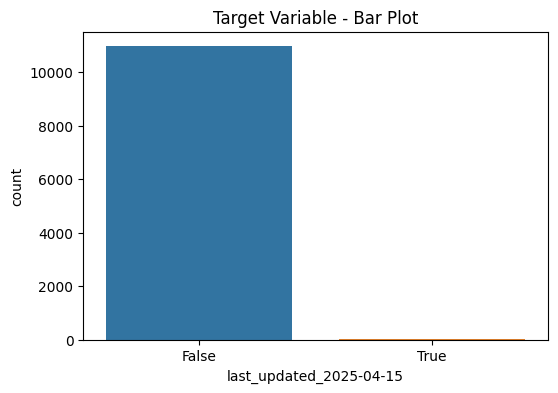

In [18]:
#Bar Plot (for target distribution if categorical)
if y.nunique() < 20:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=y)
    plt.title("Target Variable - Bar Plot")
    plt.show()

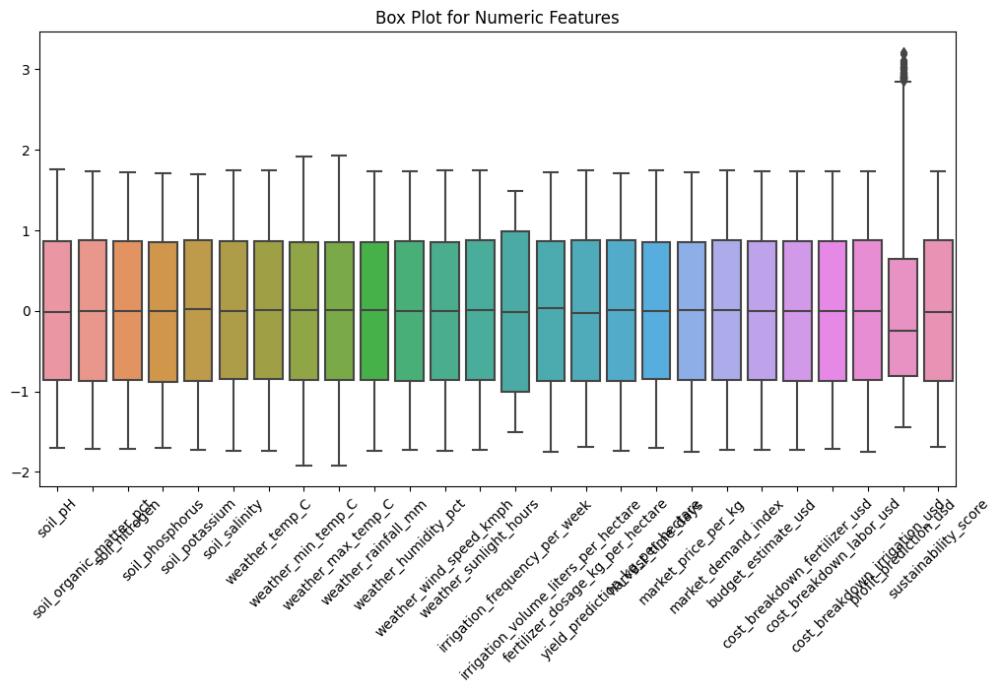

In [19]:
# Box Plot (for numeric features)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numeric_cols])
plt.xticks(rotation=45)
plt.title("Box Plot for Numeric Features")
plt.show()

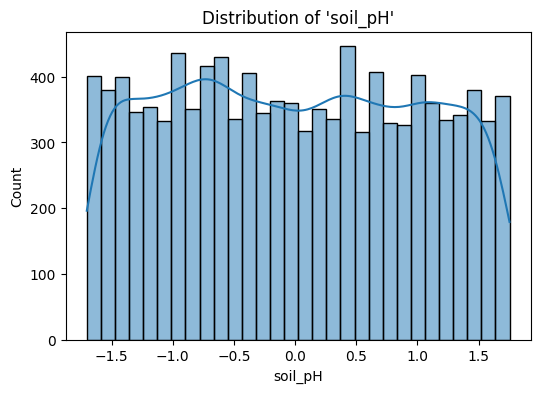

In [20]:
# Distribution Plot (histogram + KDE for a sample feature)
 # Choose the first numeric column
sample_feature = numeric_cols[0]
plt.figure(figsize=(6, 4))
sns.histplot(df[sample_feature], kde=True, bins=30)
plt.title(f"Distribution of '{sample_feature}'")
plt.show()

In [21]:
#ALGORITHMS

In [22]:
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression

In [23]:
# Encode categorical variables
for col in df.select_dtypes(include='object'):
    df[col] = LabelEncoder().fit_transform(df[col])

In [24]:
#ML MODELS

In [25]:
#Decision tree
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [26]:
y_pred = dt.predict(X_test)

In [27]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2191
        True       0.00      0.00      0.00         9

    accuracy                           0.99      2200
   macro avg       0.50      0.50      0.50      2200
weighted avg       0.99      0.99      0.99      2200



In [28]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 99.32


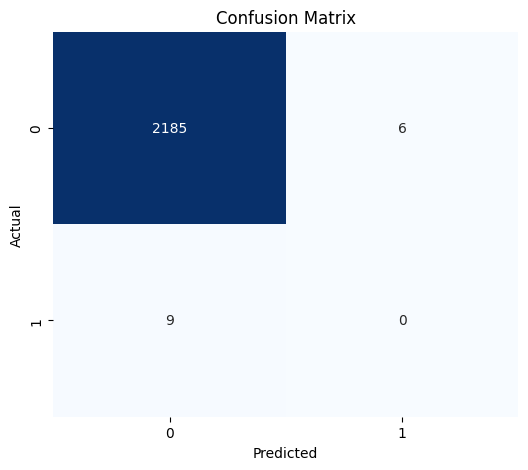

In [29]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
    
# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [30]:
# Support Vector Machine
svm = SVC()
svm.fit(X_train, y_train)

SVC()

In [31]:
y_pred = svm.predict(X_test)

In [32]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2191
        True       0.00      0.00      0.00         9

    accuracy                           1.00      2200
   macro avg       0.50      0.50      0.50      2200
weighted avg       0.99      1.00      0.99      2200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [33]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 99.59


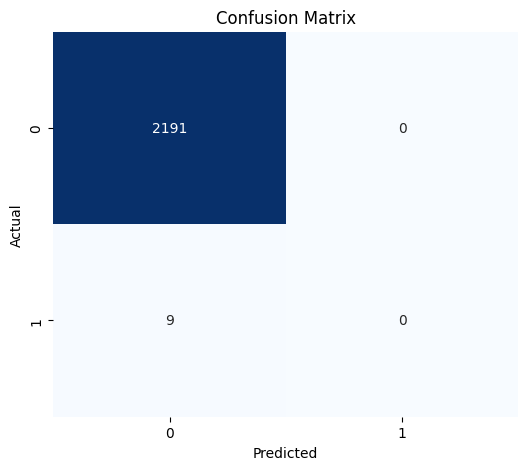

In [34]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
    
# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [35]:
#Random Forest
rf=RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [36]:
y_pred = rf.predict(X_test)

In [37]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2191
        True       0.00      0.00      0.00         9

    accuracy                           1.00      2200
   macro avg       0.50      0.50      0.50      2200
weighted avg       0.99      1.00      0.99      2200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [38]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 99.59


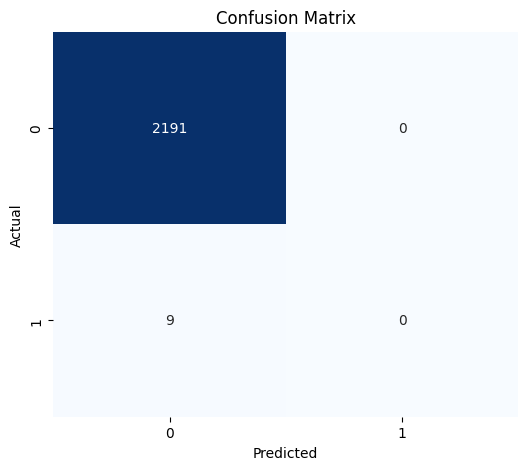

In [39]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
    
# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [40]:
#Regression

In [41]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [42]:
y_pred = lr.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))

MSE: 3.082922639591348e+17


In [43]:
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

RandomForestRegressor()

In [44]:
y_pred = rf.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))

MSE: 0.0051955


In [45]:
#Deep Learning algorithm

In [46]:
#crop image dataset

In [47]:
import tensorflow as tf

2025-04-20 04:55:25.139122: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745124925.311459      13 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745124925.360291      13 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [48]:
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

TensorFlow version: 2.18.0
Num GPUs Available: 0


2025-04-20 04:55:35.020818: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [49]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [50]:
# Dataset path
crop_image = "/kaggle/input/images-of-crop"

In [51]:
# Image Parameters
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [52]:
# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_data = train_datagen.flow_from_directory(
  crop_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_data = train_datagen.flow_from_directory(
    crop_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 881 images belonging to 4 classes.
Found 219 images belonging to 4 classes.


In [53]:
# Take one batch from the generator
image_batch, label_batch = next(train_data)

# Decode labels from one-hot to class index
labels = tf.argmax(label_batch, axis=1)

# Get class names from the generator
class_names = list(train_data.class_indices.keys())

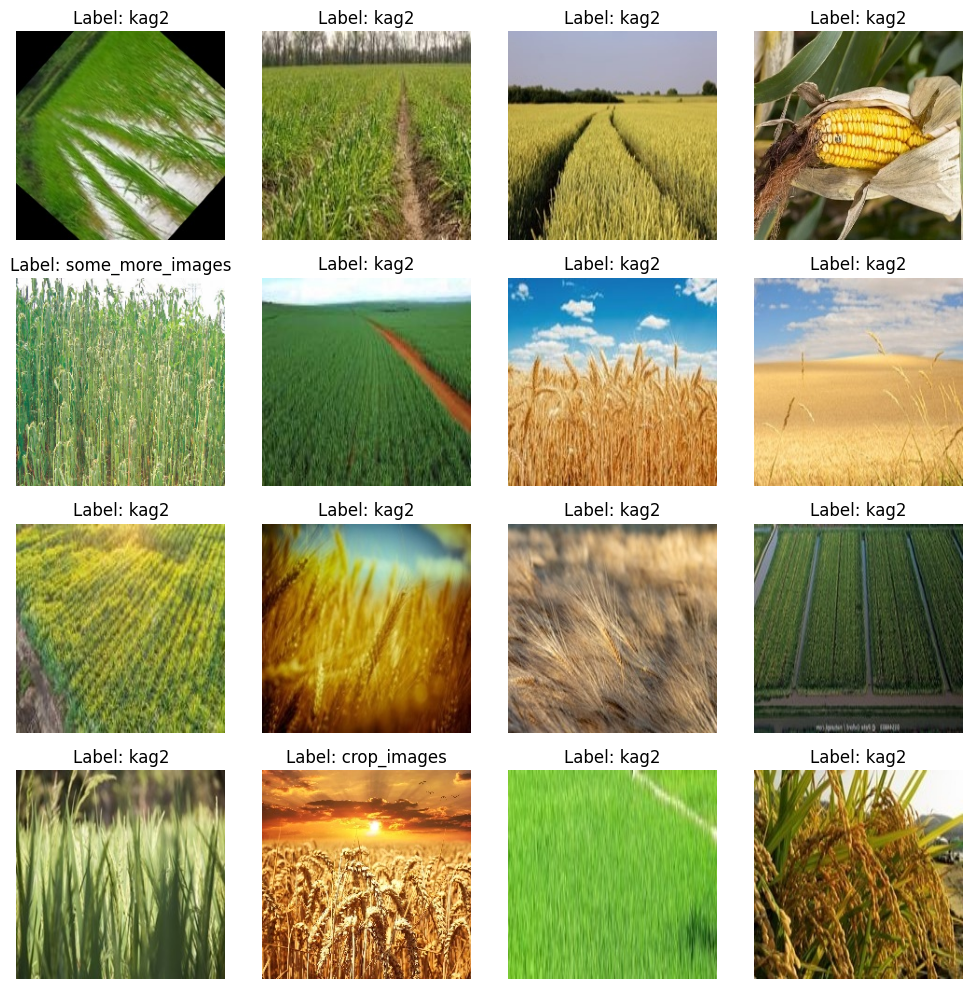

In [54]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    img = image_batch[i]
    label = labels[i].numpy()
    plt.imshow(img)  # images are already scaled RGB
    plt.title(f'Label: {class_names[label]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [55]:
# CNN Model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [56]:
# ⚙️ Compile
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [57]:
history = model.fit(
    train_data,  # Using the training data generator
    validation_data=val_data,  # Using the validation data generator
    epochs=6
)

Epoch 1/6


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


28/28 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.6768 - loss: 1.3649 - val_accuracy: 0.7260 - val_loss: 0.7967
Epoch 2/6
28/28 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - accuracy: 0.6985 - loss: 0.8928 - val_accuracy: 0.7443 - val_loss: 0.7691
Epoch 3/6
28/28 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.7261 - loss: 0.8074 - val_accuracy: 0.7443 - val_loss: 0.7352
Epoch 4/6
28/28 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - accuracy: 0.7293 - loss: 0.7731 - val_accuracy: 0.7580 - val_loss: 0.6951
Epoch 5/6
28/28 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.7299 - loss: 0.7534 - val_accuracy: 0.7443 - val_loss: 0.7836
Epoch 6/6
28/28 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.7382 - loss: 0.7358 - val_accuracy: 0.7443 - val_loss: 0.7423


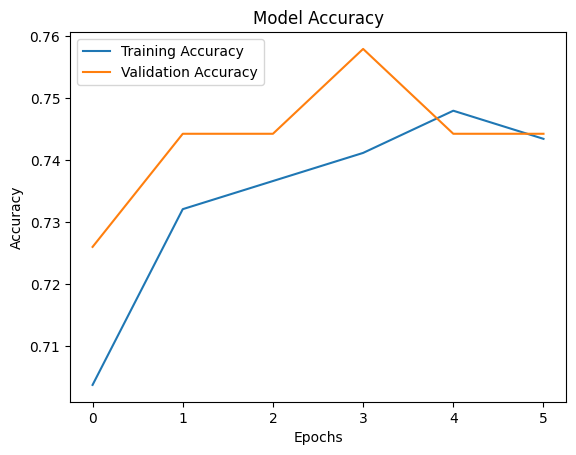

In [58]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [59]:
#Save model
model.save('crop_image_cnn_model.h5')

In [60]:
#Agricultural crop  image dataset

In [61]:
agricultural_crops = "/kaggle/input/agricultural-crops"

In [62]:
IMAGE_SIZE = (180, 180)
BATCH_SIZE = 32

In [63]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_data = datagen.flow_from_directory(
    agricultural_crops,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_data = datagen.flow_from_directory(
   agricultural_crops,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 664 images belonging to 1 classes.
Found 165 images belonging to 1 classes.


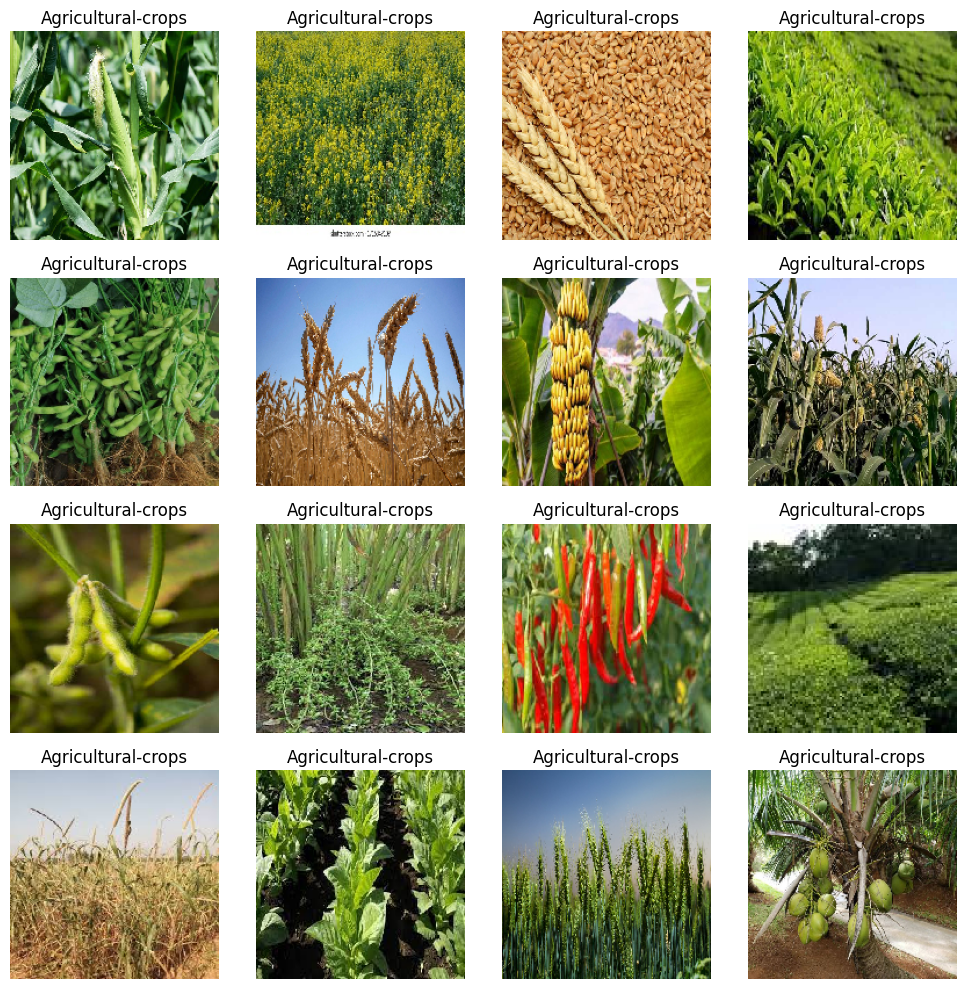

In [64]:
import matplotlib.pyplot as plt
import numpy as np

# Get class indices and reverse map to class names
class_names = list(train_data.class_indices.keys())

# Get one batch of images and labels
images, labels = next(train_data)

# Plot 16 images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])  # Get index of the class
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [65]:
# CNN Model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

In [66]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [67]:
# Train
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=4
)

Epoch 1/4


/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py:27: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.fn(y_true, y_pred, **self._fn_kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 23s 851ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 783ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 782ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 795ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


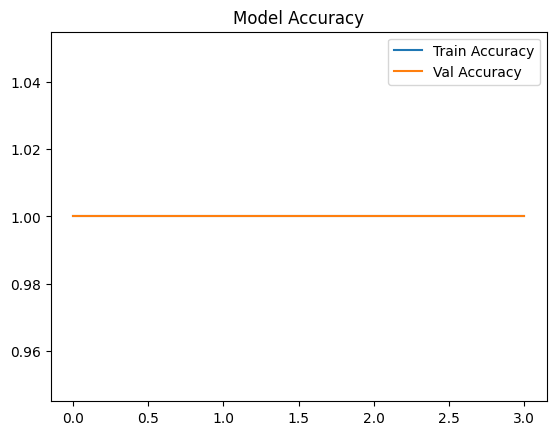

In [68]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Model Accuracy")
plt.legend()
plt.show()

In [69]:
model.save("agricultural_crop_classifier.h5")

In [70]:
#Soil type dataset

In [71]:
soil_type = '/kaggle/input/type-of-soil'

In [72]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [73]:
# Data Generator
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Load Training Data
train_data = datagen.flow_from_directory(
    soil_type,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

#Load Validation Data
val_data = datagen.flow_from_directory(
    soil_type,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 125 images belonging to 1 classes.
Found 31 images belonging to 1 classes.


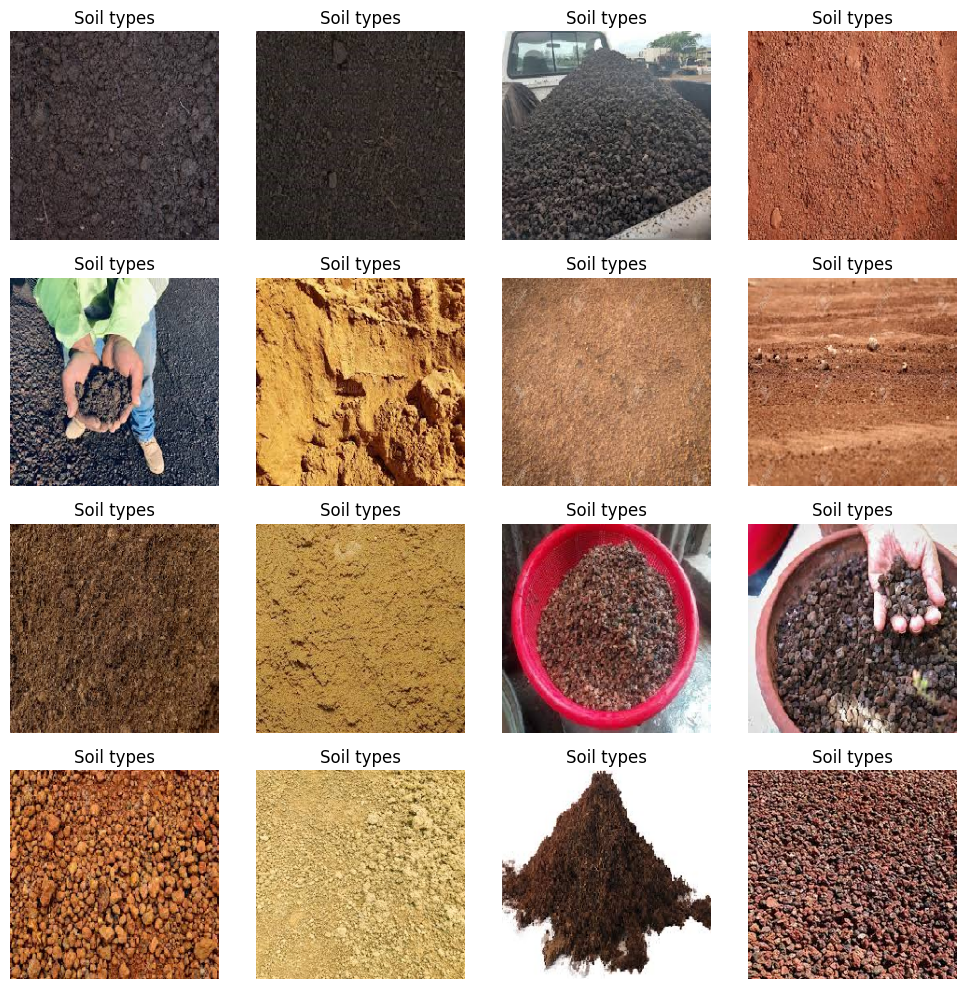

In [74]:
images, labels = next(train_data)

# 🏷️ Get class names from the generator
class_names = list(train_data.class_indices.keys())

# Plot 16 sample images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])  # Convert one-hot to class index
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [75]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

In [76]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [77]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=5
)

Epoch 1/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


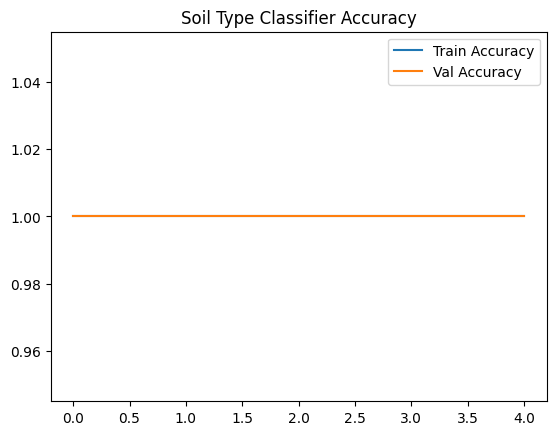

In [78]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Soil Type Classifier Accuracy")
plt.legend()
plt.show()

In [79]:
model.save("soil_type_classifier_model.h5")

In [80]:
#Vegetable dataset

In [81]:
vegetable_image = '/kaggle/input/vegetable-image'

In [82]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [83]:

# Data Generator with Rescaling + Validation Split
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Load Training Data
train_data = datagen.flow_from_directory(
    vegetable_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)
# Load Validation Data
val_data = datagen.flow_from_directory(
    vegetable_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


Found 16800 images belonging to 1 classes.
Found 4200 images belonging to 1 classes.


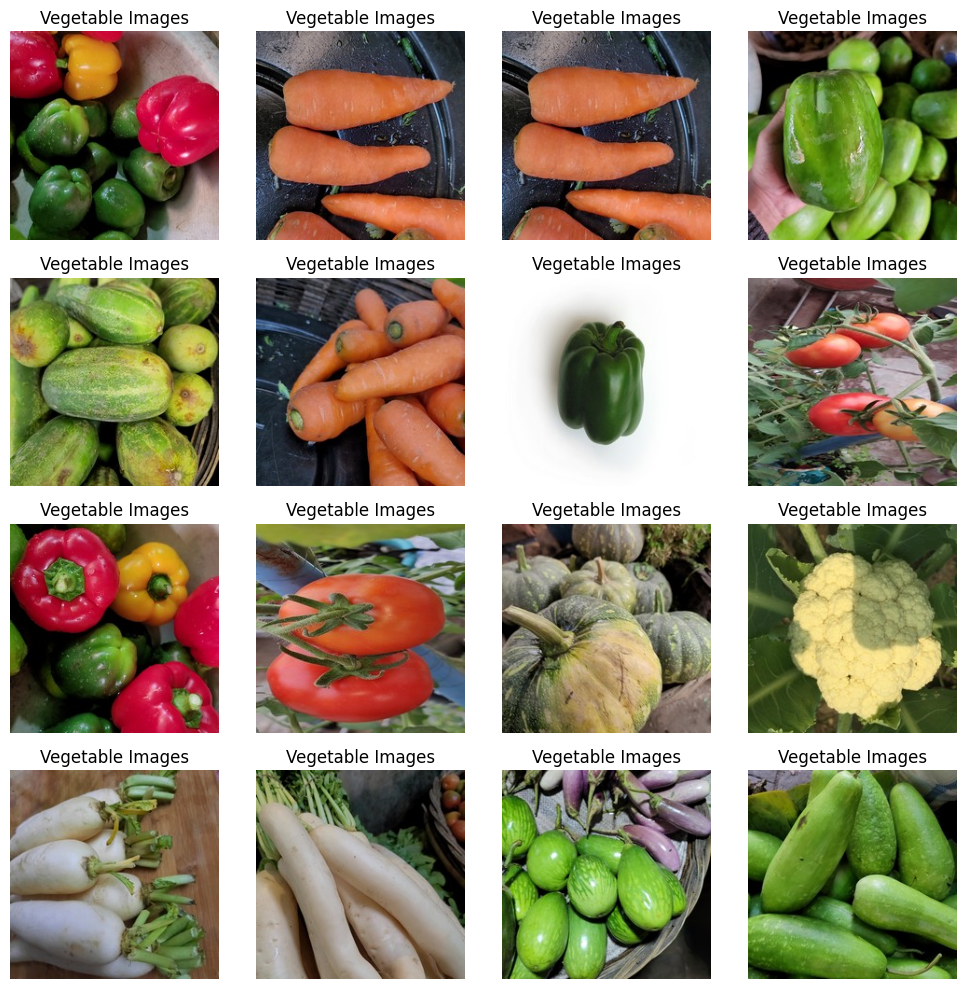

In [84]:
class_names = list(train_data.class_indices.keys())

# Get one batch of images and labels
images, labels = next(train_data)

# Plot 16 vegetable images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [85]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])


In [86]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [87]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=2
)

Epoch 1/2
525/525 ━━━━━━━━━━━━━━━━━━━━ 706s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/2
525/525 ━━━━━━━━━━━━━━━━━━━━ 700s 1s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


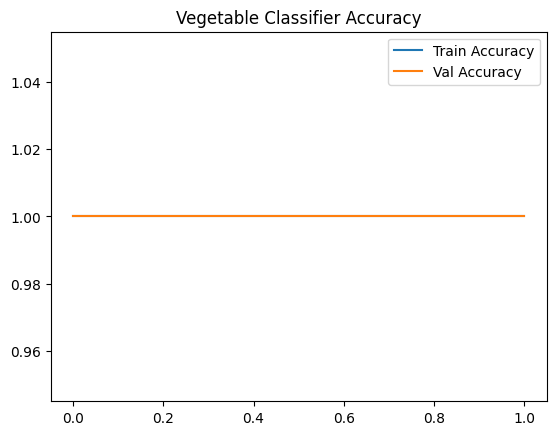

In [88]:

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Vegetable Classifier Accuracy")
plt.legend()
plt.show()
model.save("vegetable_classifier_model.h5")